In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from IPython.display import set_matplotlib_formats

# Window 의 한글 폰트 설정
plt.rc('font',family='Malgun Gothic')
plt.rc('axes', unicode_minus=False)

# 폰트가 선명하게 보이기 위해
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('retina')

# 그래프가 노트북 안에 보이게 하기 위해
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

# 데이터 불러오기

In [6]:
# 전체 회사의 데이터를 하나의 데이터프레임에 저장
company_list = ['Acer', 'Apple', 'ASUS', 'DELL', 'HP', 'LG_Gram', 'Razer', 'Samsung']
df = pd.DataFrame()

for company in company_list:
    try:
        data = pd.read_csv(f'./data/{company}_reviews.csv')
    except:
        data = pd.read_excel(f'./data/{company}_reviews.xlsx')
    data['company'] = company
    df = pd.concat([df, data], ignore_index=True)
    
df.head()

,customer_id,rating,title,country,date,content,helpful,product_name,company,product
0,DavyandTracy,5.0,Fast pc that feels like a Chromebook but with ...,미국,2023-09-14,I bought this laptop for writing and taking on...,24.0,Aspire 5 Intel Core i3-1115G4,Acer,NaN
1,jo1986,5.0,this is a great laptop for anyone,미국,2023-10-14,"I love Acer computers, this was a gift to a yo...",1.0,Aspire 5 Intel Core i3-1115G4,Acer,NaN
2,Wayne Donner,5.0,Great computer for my purpose!!!,미국,2023-07-30,I love this computer! Here's why... I wanted a...,12.0,Aspire 5 Intel Core i3-1115G4,Acer,NaN
3,bud,5.0,Durring the time I was using my Aspire 5 I was...,미국,2023-10-16,I purchased my Acer Aspire 5 A515-56-32DK Slim...,0.0,Aspire 5 Intel Core i3-1115G4,Acer,NaN
4,Bella,5.0,Good computer,미국,2023-10-11,Very good computer for browsing the web. Says ...,0.0,Aspire 5 Intel Core i3-1115G4,Acer,NaN


In [7]:
file_name = ['Lenovo_Advanced_Model.csv',
             'Lenovo_Basic_Model.csv', 
             'Lenovo_Gaming_Model.csv', 
             'MS_2in1_Model.csv', 
             'MS_laptop_Model.csv']

for fn in file_name:
    data = pd.read_csv(f'./data/{fn}', index_col=0)
    data['company'] = fn.split('_')[0]
    df = pd.concat([df, data], ignore_index=True)
    
df.tail()    

,customer_id,rating,title,country,date,content,helpful,product_name,company,product
6027,Miranda,1.0,Do not use if you are an editor,미국,2022-10-10,This laptop only lasted me 6 weeks. I talked t...,2.0,NaN,MS,NaN
6028,juan pablo,1.0,Mal producto,미국,2022-12-21,"Dejo de funcionar a los 3 meses de uso, reclam...",2.0,NaN,MS,NaN
6029,Ali A. Valika,1.0,Arrived broken,미국,2022-09-26,Arrived broken,0.0,NaN,MS,NaN
6030,Creedence,1.0,Stopped working a month after warranty expired,미국,2023-07-14,I really enjoyed this computer when it worked....,1.0,NaN,MS,NaN
6031,Barney Hughes,1.0,ZERO CUSTOMER SERVICE,미국,2021-12-15,"If you have a problem, or there is a Microsoft...",9.0,NaN,MS,NaN


In [8]:
# 제품명 컬럼 통일
pn_na_index = df[df['product_name'].isnull()].index
df.loc[pn_na_index, 'product_name'] = df.loc[pn_na_index, 'product']
df.drop('product', axis=1, inplace=True)

In [9]:
# information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6032 entries, 0 to 6031
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   customer_id   6032 non-null   object 
 1   rating        6032 non-null   float64
 2   title         6032 non-null   object 
 3   country       6032 non-null   object 
 4   date          6032 non-null   object 
 5   content       6014 non-null   object 
 6   helpful       6032 non-null   float64
 7   product_name  3643 non-null   object 
 8   company       6032 non-null   object 
dtypes: float64(2), object(7)
memory usage: 424.2+ KB


In [10]:
# 기초통계량
df.describe()

,rating,helpful
count,6032.000000,6032.000000
mean,3.495192,5.205073
std,1.599508,19.598064
min,1.000000,0.000000
25%,2.000000,0.000000
50%,4.000000,1.000000
75%,5.000000,4.000000
max,5.000000,628.000000


* 별점 평균은 약 3.5
* 도움이 되는 리뷰라고 판단한 수는 평균 5.2, 최대 628

In [11]:
# 리뷰작성일을 연, 월, 일, 요일로 분리
year_list = []
month_list = []
day_list = []
dayofweek_list = []


for i in range(df.shape[0]):
    if type(df['date'][i]) == str:
        date = pd.to_datetime(df['date'][i])
    else:
        date = df['date'][i]
        
    year = date.strftime('%Y')
    month = date.strftime('%m')
    day = date.strftime('%d')
    dow = date.dayofweek
    
    year_list.append(year)
    month_list.append(month)
    day_list.append(day)
    dayofweek_list.append(dow)
    
df['year'] = year_list
df['month'] = month_list
df['day'] = day_list
df['dayofweek'] = dayofweek_list

df.head()        

,customer_id,rating,title,country,date,content,helpful,product_name,company,year,month,day,dayofweek
0,DavyandTracy,5.0,Fast pc that feels like a Chromebook but with ...,미국,2023-09-14,I bought this laptop for writing and taking on...,24.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,09,14,3
1,jo1986,5.0,this is a great laptop for anyone,미국,2023-10-14,"I love Acer computers, this was a gift to a yo...",1.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,10,14,5
2,Wayne Donner,5.0,Great computer for my purpose!!!,미국,2023-07-30,I love this computer! Here's why... I wanted a...,12.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,07,30,6
3,bud,5.0,Durring the time I was using my Aspire 5 I was...,미국,2023-10-16,I purchased my Acer Aspire 5 A515-56-32DK Slim...,0.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,10,16,0
4,Bella,5.0,Good computer,미국,2023-10-11,Very good computer for browsing the web. Says ...,0.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,10,11,2


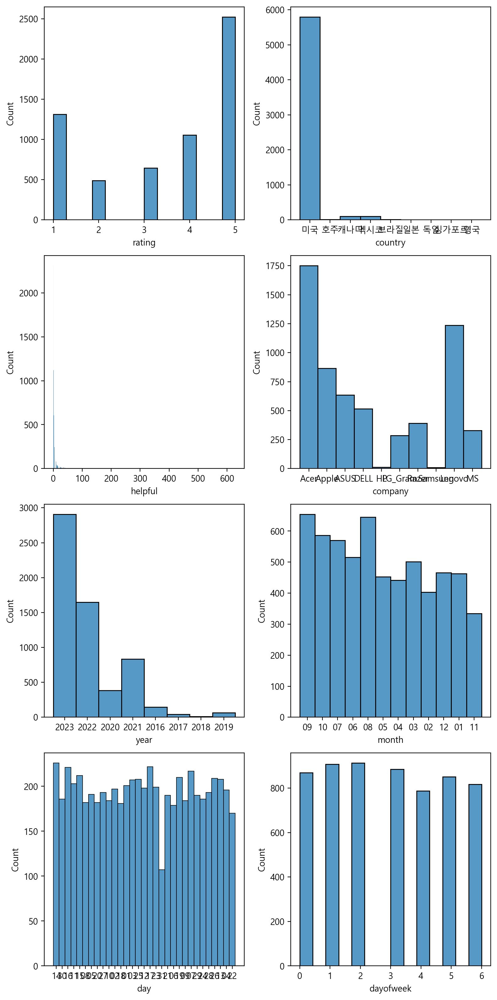

In [12]:
col_list = df.columns
col_list = col_list.drop(['customer_id', 'title', 'date', 'content', 'product_name'])

fig, axes = plt.subplots(4, 2, figsize=(8, 16))

for i, cname in enumerate(col_list):
    row = i // 2
    col = i % 2
    sns.histplot(x=cname, data=df, ax=axes[row][col])
    
fig.tight_layout()

* rating: 5점 > 1점 > 4점 > 3점 > 1점
* country: 미국이 압도적으로 많다.
* helpful: 0 값이 가장 많다.
* company: HP와 삼성의 데이터가 몹시 적고, Acer의 데이터가 가장 많다.
* year: 2023년의 리뷰가 가장 많고, 가장 적은 것은 2018년이다.
* month: 9월에 가장 많은 리뷰가 작성되었고, 11월의 리뷰가 가장 적다.
* day
* dayofweek: 화요일의 리뷰가 가장 많고, 금요일의 리뷰가 가장 적다.

In [13]:
# 제목에 리뷰가 있고, 내용에는 아무것도 안 적은 사람들도 있다.
df[df['content'].isnull()].head()

,customer_id,rating,title,country,date,content,helpful,product_name,company,year,month,day,dayofweek
225,petermatthews,3.0,Charger not working but everything else are wo...,미국,2022-11-26,NaN,0.0,Aspire 5 Intel Core i3-1115G4,Acer,2022,11,26,5
582,tung Nguyen,4.0,very good,미국,2021-10-22,NaN,0.0,Swift 3 AMD Ryzen 7 4700u,Acer,2021,10,22,4
913,Bryan Chinga Leon,5.0,Perfecta para editar y también puedo jugar war...,미국,2023-09-13,NaN,0.0,Nitro 5 Intel Core i5-12500H,Acer,2023,09,13,2
1032,Alberto B.,4.0,Bom nível,미국,2022-12-09,NaN,1.0,Nitro 5 Intel Core i5-12500H,Acer,2022,12,09,4
1038,Ryan,4.0,About what's needed,미국,2022-10-10,NaN,0.0,Nitro 5 Intel Core i5-12500H,Acer,2022,10,10,0


In [14]:
# 영어권이 아닌 국가의 리뷰는 제외하고 사용해야 한다.
df['country'].value_counts()

country
미국      5793
캐나다      106
멕시코      101
브라질       13
호주         9
싱가포르       4
독일         3
일본         2
영국         1
Name: count, dtype: int64

In [15]:
df = df[(df['country'] == '미국') | (df['country'] == '캐나다') | (df['country'] == '호주') | (df['country'] == '싱가포르') | (df['country'] == '영국')]
df.reset_index(inplace=True, drop=True)
df.shape

(5913, 13)

In [16]:
# 스페인어, 불어 제외
for i in range(df.shape[0]):
    if pd.isna(df['content'][i]) == True:
        val = df['title'][i]
    else:
        val = df['content'][i]
    if (val.find(' que ') != -1) & (val.find(' muy ') != -1):
        df.drop(i, axis=0, inplace=True)
        
df.reset_index(inplace=True, drop=True)
df.shape

(5875, 13)

# 리뷰 토픽 모델링

In [17]:
from wordcloud import WordCloud, STOPWORDS
import random

import nltk
from nltk.tokenize import TreebankWordTokenizer

from nltk.corpus import stopwords
from sklearn.feature_extraction import _stop_words

from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from nltk import pos_tag
nltk.download('averaged_perceptron_tagger')

import gensim
from gensim import corpora
from gensim.models.ldamodel import LdaModel
from gensim.models import CoherenceModel

from pprint import pprint

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\S\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [16]:
# 품사 태깅
def get_pos(w):
    tag = pos_tag([w])[0][1][0].upper() # ex. [('am', 'VBP')]
    if tag == 'V':
        return wordnet.VERB
    elif tag == 'N':
        return wordnet.NOUN
    elif tag == 'J':
        return wordnet.ADJ
    elif tag == 'R':
        return wordnet.ADV
    else:
        return wordnet.NOUN

# 토크나이저
def my_tokenizer(d):
    tokenizer = TreebankWordTokenizer()
    lem = WordNetLemmatizer()
    
    d1 = tokenizer.tokenize(d) # 문장을 단어 단위로 분리
    d2 = [w.lower() for w in d1 if w.isalpha()] # 단어가 모두 알파벳으로 구성된 경우 소문자화
    d3 = [w for w in d2 if not w in my_stopwords] # 불용어 제거1
    d4 = [lem.lemmatize(w, get_pos(w)) for w in d3] # 어간 추출
    d5 = [w for w in d4 if not w in my_stopwords] # 불용어 제거2
    
    return d5

In [42]:
class NLP_Processor():
    def __init__(self, df):
        self.df = df
    
    # 리뷰를 토큰화한 리스트로 만들기
    def make_tokens_list(self):
        doc = []

        for i in range(self.df.shape[0]):
            if pd.isna(self.df['content'][i]):
                doc.append(self.df['title'][i])
            else:
                doc.append(self.df['content'][i])
        
        doc = pd.Series(doc)
        tokens = doc.apply(my_tokenizer)
        return tokens
    
    # 자주 등장하는 단어 그래프
    def plot_frequent_tokens(self, tokens, k): # k: 토큰 개수
        total_tokens = []

        for i in range(len(tokens)):
            for t in tokens[i]:
                total_tokens.append(t)
                
        text = nltk.Text(total_tokens)
        
        plt.figure(figsize=(12, 6))
        text.plot(k)
        plt.show()
    
    # 워드클라우드
    def make_wordcloud(self, tokens, k): # k: 워드클라우드에 표시할 단어 개수
        total_tokens = []

        for i in range(len(tokens)):
            for t in tokens[i]:
                total_tokens.append(t)
                
        text = nltk.Text(total_tokens)
        data = text.vocab().most_common(k)
        wc = WordCloud(font_path='c:/Windows/Fonts/malgun.ttf', 
                       relative_scaling=0.2, 
                       background_color='white', 
                       min_font_size=1, max_font_size=40, 
                       stopwords=my_stopwords).generate(' '.join(total_tokens))

        plt.figure(figsize=(12, 12))
        plt.imshow(wc.recolor(color_func=image_colors), interpolation='bilinear')
        plt.axis('off')
        plt.show()
    
    # LDA 토픽 모델링
    def TopicLDA_makemodel(self, tokens, nw): # nw: 토픽을 표현할 단어 개수          
        dictionary = corpora.Dictionary(tokens)
        corpus = [dictionary.doc2bow(t) for t in tokens]
        
        # 응집도가 가장 높은 토픽 수 선택(응집도: 토픽을 구성하는 단어들의 관련성이 얼마나 높은가)
        coherence_score = pd.Series()

        for i in range(3, 15):
            model = LdaModel(corpus=corpus,
                             id2word=dictionary,
                             num_topics=i,
                             passes=10)
            coherence_model = CoherenceModel(model, 
                                             texts=tokens, 
                                             dictionary=dictionary, 
                                             coherence='c_v')
            cs = coherence_model.get_coherence()
            coherence_score[i] = cs
        n = coherence_score.idxmax()
            
        #LDA 모델
        model = LdaModel(corpus=corpus,
                         id2word=dictionary,
                         num_topics=n,
                         passes=10)
        
        topics = model.print_topics(num_words = nw)
        return corpus, coherence_score, n, model, topics
    
    # LDA 결과 문서별 토픽 분포도
    def TopicLDA_distribution(self, model, corpus):
        
        document_topic = [model[d] for d in corpus]
       
        document_dominant_theme = []
        portion_of_dominant_topic = []

        for i in range(len(document_topic)):

            doc_theme=[]

            for j in range(0,len(document_topic[i])):

                doc_theme.append(document_topic[i][j][1])

            m = doc_theme.index(max(doc_theme))
            document_dominant_theme.append(document_topic[i][m][0])
            portion_of_dominant_topic.append(document_topic[i][m][1])
            
        df_dist = self.df.copy()
        df_dist['dominant topic'] = document_dominant_theme
        df_dist['portion of dominant topic'] = portion_of_dominant_topic

        sns.histplot(df_dist['dominant topic'])
        plt.show()
        
        return df_dist
    
    # 추출된 토픽들의 일관성(coherence)을 평가
    def TopicLDA_coherence(self, model, corpus, n):

        top_topics = model.top_topics(corpus)

        avg_topic_coherence = sum([t[1] for t in top_topics]) / n
        print('Average topic coherence: %.4f.' % avg_topic_coherence)

        pprint(top_topics)
        
        return avg_topic_coherence


## 전사 통합 데이터

In [75]:
# stopwords 정의
nltk_stopwords = set(stopwords.words('english')) 
sklearn_stopwords = set(_stop_words.ENGLISH_STOP_WORDS)
custom_stopwords = set(['laptop', 'computer', 'amazon', 'acer', 'apple', 'asus', 'dell', 'hp', 'lenovo', 'lg', 'ms', 'microsoft', 'razer', 'samsung', 'surface', 'macbook'
                        'la', 'el', 'en', 'e', 'para'])

my_stopwords = nltk_stopwords.union(sklearn_stopwords)
my_stopwords = my_stopwords.union(custom_stopwords)

### 전체 리뷰

In [76]:
total = NLP_Processor(df)

In [77]:
# 토큰화
tokens = total.make_tokens_list()
tokens[:10]

0    [bought, write, online, class, primarily, keyb...
1    [love, gift, young, man, college, originally, ...
2    [love, want, portable, use, information, web, ...
3    [purchase, aspire, slim, early, function, exce...
4    [good, browsing, say, game, highly, recommend,...
5    [easy, set, right, come, window, ready, turn, ...
6    [really, fast, good, keyboard, wifi, screen, c...
7    [year, love, lightweight, super, fast, bought,...
8    [great, able, need, play, game, easily, low, g...
9    [bought, ca, beat, slim, keyboard, nice, feel,...
dtype: object

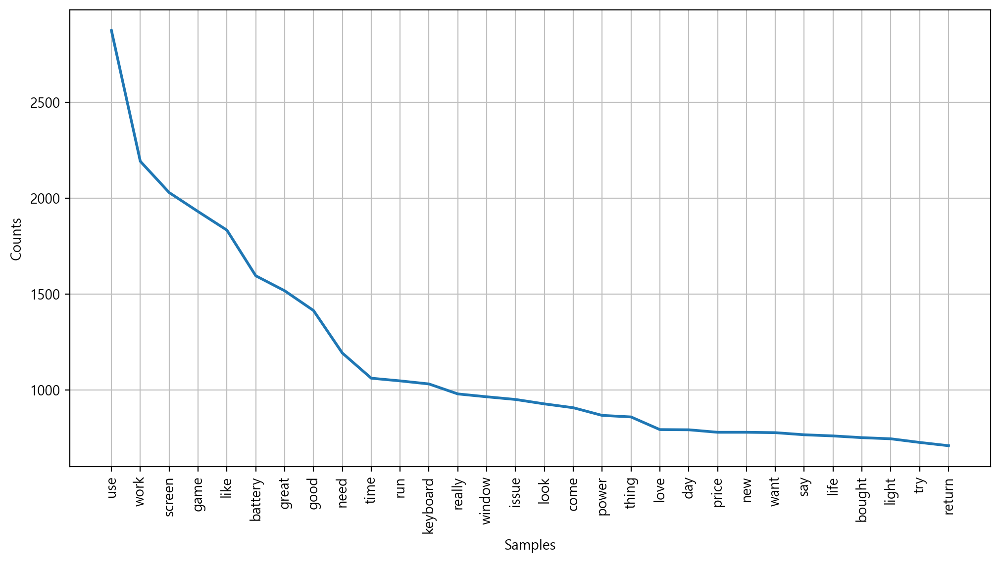

In [78]:
# 단여별 등장빈도 그래프
total.plot_frequent_tokens(tokens, 30)

* work
* screen
* game
* time
* battery, power
* keyboard
* windows
* price
* light

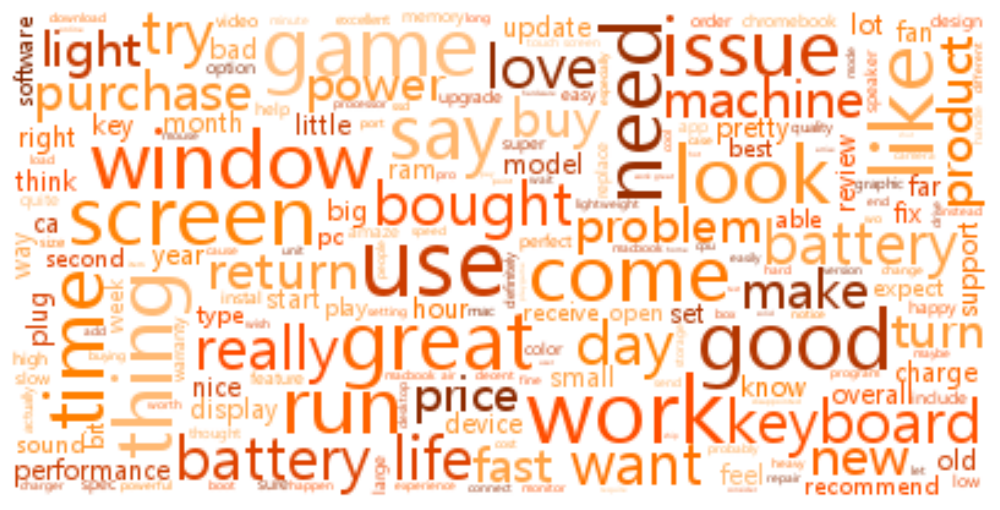

In [79]:
# 워드클라우드
def image_colors(word, font_size, position, orientation, random_state=None, **kwargs):
    return'hsl(25, 150%%, %d%%)' % random.randint(20, 80)

total.make_wordcloud(tokens, 80)

In [80]:
# LDA 모델링
corpus, coherence_score, n, model, topics = total.TopicLDA_makemodel(tokens, 7)

In [81]:
# 토픽
topics

[(0,
  '0.020*"port" + 0.016*"use" + 0.015*"usb" + 0.008*"intel" + 0.008*"game" + 0.008*"power" + 0.008*"ram"'),
 (1,
  '0.045*"ram" + 0.023*"ssd" + 0.017*"gb" + 0.016*"drive" + 0.014*"upgrade" + 0.013*"window" + 0.011*"good"'),
 (2,
  '0.044*"great" + 0.033*"game" + 0.025*"work" + 0.020*"run" + 0.017*"fan" + 0.014*"good" + 0.013*"really"'),
 (3,
  '0.040*"love" + 0.036*"use" + 0.032*"screen" + 0.023*"macbook" + 0.019*"easy" + 0.019*"great" + 0.018*"work"'),
 (4,
  '0.013*"se" + 0.011*"lo" + 0.008*"pero" + 0.008*"vr" + 0.006*"placement" + 0.006*"endless" + 0.005*"wireless"'),
 (5,
  '0.016*"battery" + 0.014*"work" + 0.014*"use" + 0.013*"come" + 0.013*"screen" + 0.013*"need" + 0.011*"product"'),
 (6,
  '0.020*"return" + 0.017*"work" + 0.015*"issue" + 0.014*"screen" + 0.014*"try" + 0.014*"day" + 0.013*"time"'),
 (7,
  '0.014*"gift" + 0.011*"packaging" + 0.009*"box" + 0.009*"arrive" + 0.008*"por" + 0.008*"los" + 0.008*"buena"'),
 (8,
  '0.030*"use" + 0.013*"work" + 0.012*"time" + 0.011*"l

0. usb 포트
1. RAM, SSD, 업그레이드
2. 게임
3. 화면, 맥북
4. (스페인어...)
5. 배터리
6. 이슈 발생
7. 선물, 포장, 상자
8. 일, 배터리
9. 게임
10. 가격
11. 윈도우, 업데이트
12. 배터리

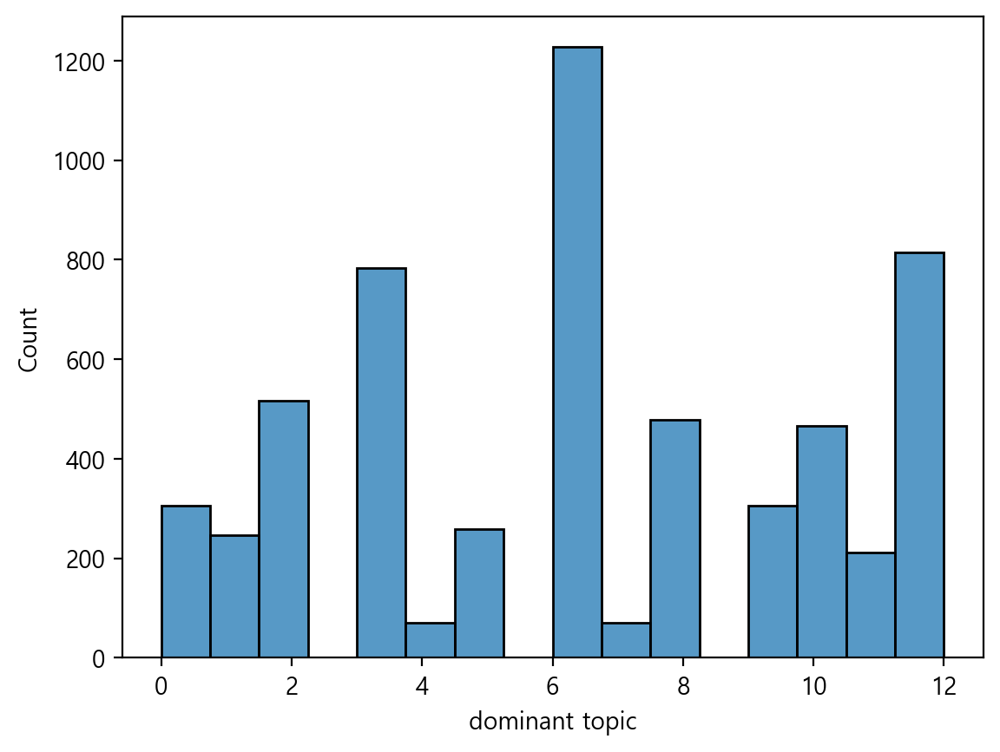

,customer_id,rating,title,country,date,content,helpful,product_name,company,year,month,day,dayofweek,dominant topic,portion of dominant topic
0,DavyandTracy,5.0,Fast pc that feels like a Chromebook but with ...,미국,2023-09-14,I bought this laptop for writing and taking on...,24.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,09,14,3,8,0.372642
1,jo1986,5.0,this is a great laptop for anyone,미국,2023-10-14,"I love Acer computers, this was a gift to a yo...",1.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,10,14,5,2,0.780496
2,Wayne Donner,5.0,Great computer for my purpose!!!,미국,2023-07-30,I love this computer! Here's why... I wanted a...,12.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,07,30,6,1,0.303818
3,bud,5.0,Durring the time I was using my Aspire 5 I was...,미국,2023-10-16,I purchased my Acer Aspire 5 A515-56-32DK Slim...,0.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,10,16,0,0,0.461245
4,Bella,5.0,Good computer,미국,2023-10-11,Very good computer for browsing the web. Says ...,0.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,10,11,2,9,0.431859


In [82]:
# 토픽별 문서 분포
df_dist = total.TopicLDA_distribution(model, corpus)
df_dist.head()

* 6번 토픽의 비중이 가장 크다.

In [83]:
# 토픽 일관성
avg_topic_coherence = total.TopicLDA_coherence(model, corpus, n)

Average topic coherence: -3.9105.
[([(0.045214485, 'ram'),
   (0.022823654, 'ssd'),
   (0.016862838, 'gb'),
   (0.015731635, 'drive'),
   (0.014074973, 'upgrade'),
   (0.013153772, 'window'),
   (0.010868451, 'good'),
   (0.010172477, 'hard'),
   (0.0097202435, 'storage'),
   (0.009318722, 'come'),
   (0.008779988, 'add'),
   (0.008740376, 'say'),
   (0.008252332, 'instal'),
   (0.008104749, 'like'),
   (0.0075624483, 'keyboard'),
   (0.007196019, 'key'),
   (0.0068930946, 'price'),
   (0.00669267, 'look'),
   (0.0063852062, 'processor'),
   (0.0058789393, 'screen')],
  -1.498255580078919),
 ([(0.03864742, 'battery'),
   (0.020424172, 'life'),
   (0.019996969, 'like'),
   (0.019801706, 'game'),
   (0.018232318, 'use'),
   (0.013212976, 'keyboard'),
   (0.013167738, 'screen'),
   (0.0125771705, 'feel'),
   (0.0120450705, 'really'),
   (0.010743258, 'light'),
   (0.010417746, 'good'),
   (0.010401355, 'great'),
   (0.010124184, 'thing'),
   (0.009747377, 'hour'),
   (0.009312949, 'power'

### 5점 리뷰

In [84]:
df_5 = df[df['rating'] == 5.0]
df_5.reset_index(inplace=True, drop=True)
df_5.head()

,customer_id,rating,title,country,date,content,helpful,product_name,company,year,month,day,dayofweek
0,DavyandTracy,5.0,Fast pc that feels like a Chromebook but with ...,미국,2023-09-14,I bought this laptop for writing and taking on...,24.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,09,14,3
1,jo1986,5.0,this is a great laptop for anyone,미국,2023-10-14,"I love Acer computers, this was a gift to a yo...",1.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,10,14,5
2,Wayne Donner,5.0,Great computer for my purpose!!!,미국,2023-07-30,I love this computer! Here's why... I wanted a...,12.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,07,30,6
3,bud,5.0,Durring the time I was using my Aspire 5 I was...,미국,2023-10-16,I purchased my Acer Aspire 5 A515-56-32DK Slim...,0.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,10,16,0
4,Bella,5.0,Good computer,미국,2023-10-11,Very good computer for browsing the web. Says ...,0.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,10,11,2


In [85]:
total_5 = NLP_Processor(df_5)

In [86]:
# 토큰화
tokens = total_5.make_tokens_list()
tokens[:10]

0    [bought, write, online, class, primarily, keyb...
1    [love, gift, young, man, college, originally, ...
2    [love, want, portable, use, information, web, ...
3    [purchase, aspire, slim, early, function, exce...
4    [good, browsing, say, game, highly, recommend,...
5    [easy, set, right, come, window, ready, turn, ...
6    [really, fast, good, keyboard, wifi, screen, c...
7    [year, love, lightweight, super, fast, bought,...
8    [great, able, need, play, game, easily, low, g...
9    [bought, ca, beat, slim, keyboard, nice, feel,...
dtype: object

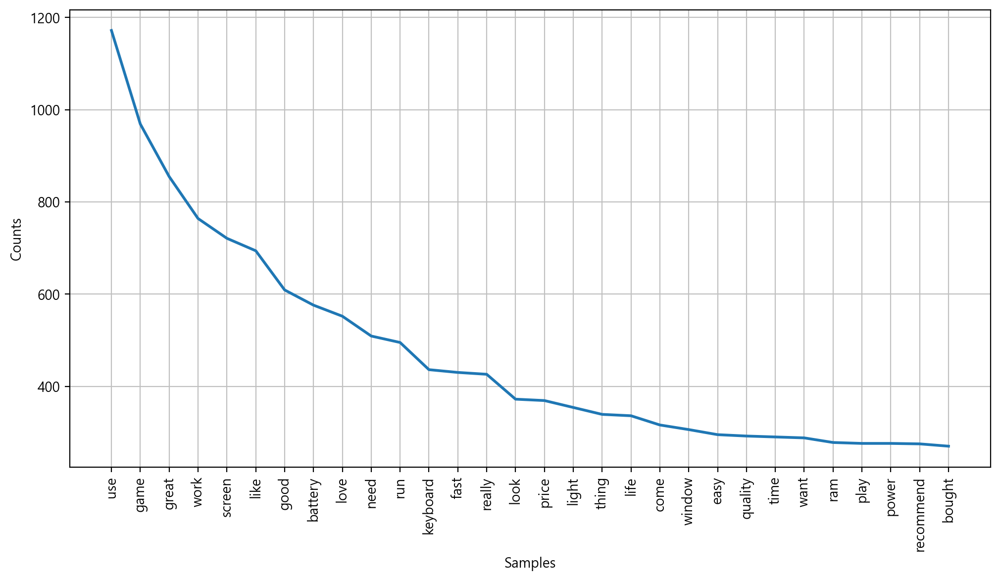

In [87]:
# 단여별 등장빈도 그래프
total_5.plot_frequent_tokens(tokens, 30)

* 게임
* work
* 화면
* 배터리
* 키보드
* 가격
* 가벼움
* 윈도우
* 쉬움
* 품질

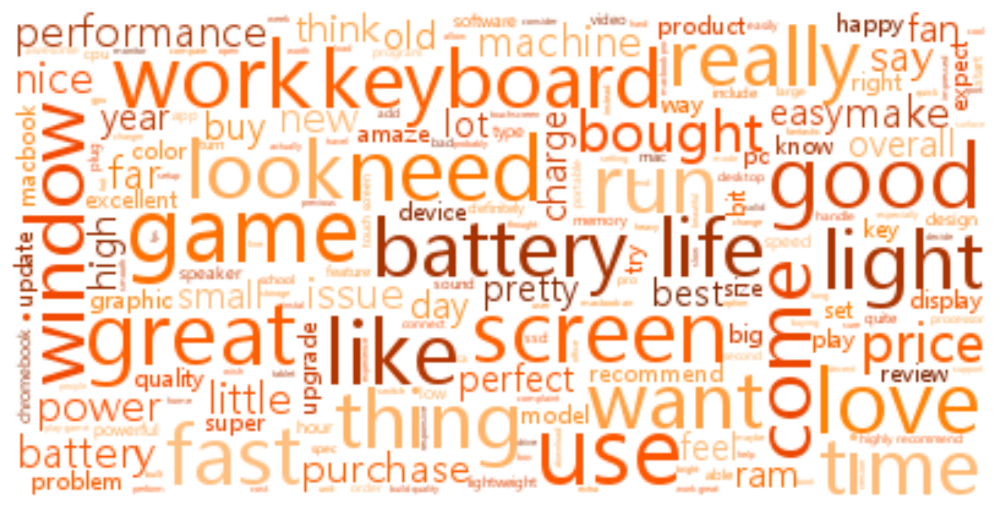

In [88]:
# 워드클라우드
def image_colors(word, font_size, position, orientation, random_state=None, **kwargs):
    return'hsl(25, 150%%, %d%%)' % random.randint(20, 80)

total_5.make_wordcloud(tokens, 80)

In [89]:
# LDA 모델링
corpus, coherence_score, n, model, topics = total_5.TopicLDA_makemodel(tokens, 7)

In [90]:
# 토픽
topics

[(0,
  '0.019*"like" + 0.019*"use" + 0.014*"keyboard" + 0.013*"power" + 0.013*"really" + 0.010*"good" + 0.009*"nice"'),
 (1,
  '0.055*"game" + 0.044*"great" + 0.026*"ram" + 0.018*"play" + 0.015*"work" + 0.013*"recommend" + 0.012*"price"'),
 (2,
  '0.021*"game" + 0.016*"use" + 0.015*"run" + 0.013*"like" + 0.012*"battery" + 0.012*"screen" + 0.010*"window"'),
 (3,
  '0.043*"surface" + 0.029*"pro" + 0.012*"work" + 0.012*"use" + 0.012*"pen" + 0.011*"macbook" + 0.009*"display"'),
 (4,
  '0.019*"use" + 0.018*"screen" + 0.018*"love" + 0.017*"battery" + 0.012*"fast" + 0.012*"great" + 0.012*"life"'),
 (5,
  '0.034*"use" + 0.032*"work" + 0.027*"great" + 0.014*"need" + 0.013*"bought" + 0.013*"price" + 0.012*"perfect"'),
 (6,
  '0.009*"una" + 0.009*"use" + 0.007*"clone" + 0.007*"condiciones" + 0.007*"batter" + 0.007*"position" + 0.006*"golf"'),
 (7,
  '0.036*"love" + 0.020*"good" + 0.014*"excelente" + 0.011*"window" + 0.010*"touchscreen" + 0.010*"amazingly" + 0.010*"video"'),
 (8,
  '0.022*"surface

0. 키보드
1. 게임, RAM, 가격
2. 게임, 배터리
3. (제품명이 낀 듯 함)
4. 화면, 배터리, 빠름
5. 가격
6. 상태가 좋음(?)
7. 윈도우, 터치스크린
8. 태블릿

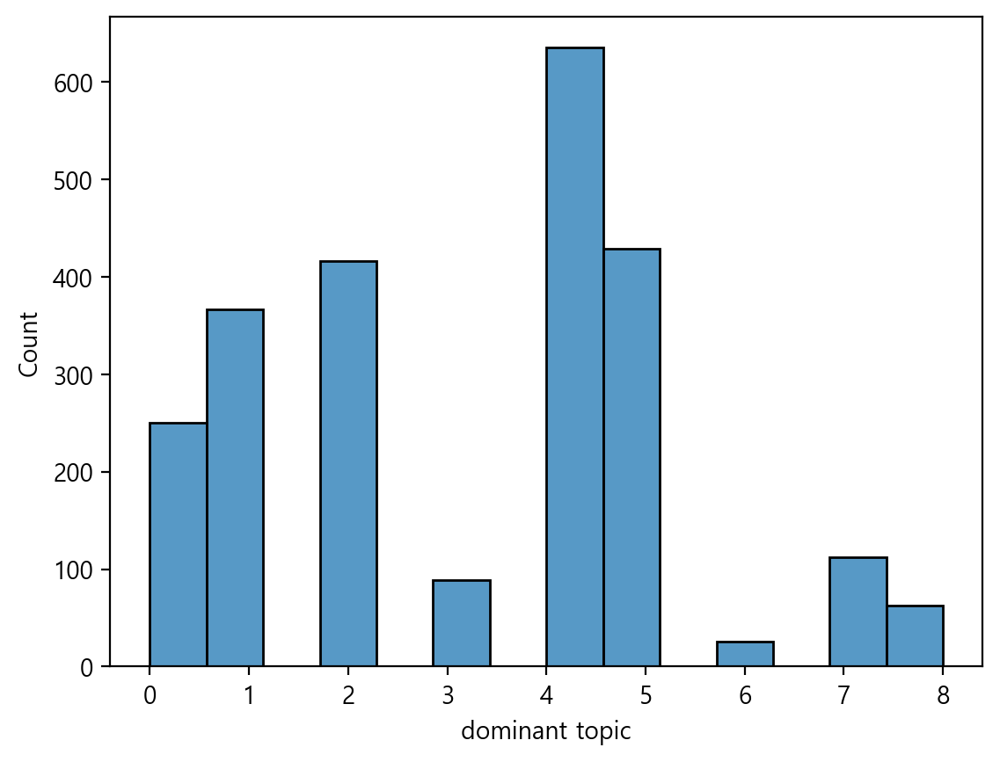

,customer_id,rating,title,country,date,content,helpful,product_name,company,year,month,day,dayofweek,dominant topic,portion of dominant topic
0,DavyandTracy,5.0,Fast pc that feels like a Chromebook but with ...,미국,2023-09-14,I bought this laptop for writing and taking on...,24.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,09,14,3,2,0.469811
1,jo1986,5.0,this is a great laptop for anyone,미국,2023-10-14,"I love Acer computers, this was a gift to a yo...",1.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,10,14,5,5,0.975964
2,Wayne Donner,5.0,Great computer for my purpose!!!,미국,2023-07-30,I love this computer! Here's why... I wanted a...,12.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,07,30,6,2,0.446587
3,bud,5.0,Durring the time I was using my Aspire 5 I was...,미국,2023-10-16,I purchased my Acer Aspire 5 A515-56-32DK Slim...,0.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,10,16,0,0,0.787987
4,Bella,5.0,Good computer,미국,2023-10-11,Very good computer for browsing the web. Says ...,0.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,10,11,2,1,0.498611


In [91]:
# 토픽별 문서 분포
df_dist = total_5.TopicLDA_distribution(model, corpus)
df_dist.head()

* 4번 토픽이 가장 많이 나타남

In [92]:
# 토픽 일관성
avg_topic_coherence = total_5.TopicLDA_coherence(model, corpus, n)

Average topic coherence: -4.2381.
[([(0.021022437, 'game'),
   (0.016343867, 'use'),
   (0.015229825, 'run'),
   (0.013233762, 'like'),
   (0.012180703, 'battery'),
   (0.0116110975, 'screen'),
   (0.009593122, 'window'),
   (0.00915896, 'keyboard'),
   (0.008927084, 'need'),
   (0.007312672, 'fan'),
   (0.007203467, 'thing'),
   (0.0070157833, 'look'),
   (0.0068313424, 'great'),
   (0.00679382, 'really'),
   (0.006594198, 'life'),
   (0.0060582, 'good'),
   (0.0059838127, 'performance'),
   (0.005904057, 'ram'),
   (0.005823005, 'come'),
   (0.0056192903, 'quality')],
  -1.4701520369282894),
 ([(0.018933615, 'like'),
   (0.01891, 'use'),
   (0.013592387, 'keyboard'),
   (0.013245678, 'power'),
   (0.012593318, 'really'),
   (0.009892021, 'good'),
   (0.0094607705, 'nice'),
   (0.009076167, 'feel'),
   (0.00797361, 'screen'),
   (0.0078831995, 'little'),
   (0.007778016, 'run'),
   (0.007680567, 'make'),
   (0.0074116406, 'thing'),
   (0.00731399, 'look'),
   (0.0068358877, 'come'),
 

### 1점 리뷰

In [93]:
df_1 = df[df['rating'] == 1.0]
df_1.reset_index(inplace=True, drop=True)
df_1.head()

,customer_id,rating,title,country,date,content,helpful,product_name,company,year,month,day,dayofweek
0,techygardengirl,1.0,Beyond Stunned --- UPDATED RATING,미국,2022-12-17,JAN 2023 - The computer is stellar except for ...,53.0,Aspire 5 Intel Core i3-1115G4,Acer,2022,12,17,5
1,Candide,1.0,"Wanted to love it, but disappointed",미국,2023-04-27,After having used this laptop for five months ...,12.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,04,27,3
2,brandon,1.0,avoid at all costs. ships w. defective bios!,미국,2022-09-14,i bought this laptop thinking it would be perf...,28.0,Aspire 5 Intel Core i3-1115G4,Acer,2022,09,14,2
3,Denese Dominguez,1.0,"Without compare, this is literally the worst l...",미국,2023-03-11,The cursor constantly disappears from the scre...,8.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,03,11,5
4,Amazon Customer,1.0,Lots of problems with this computer,미국,2023-03-24,In the first 3 1/2 months this computer has lo...,7.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,03,24,4


In [94]:
total_1 = NLP_Processor(df_1)

In [95]:
# 토큰화
tokens = total_1.make_tokens_list()
tokens[:10]

0    [jan, stellar, thing, usbs, completely, defunc...
1    [use, month, exactly, feel, time, share, opini...
2    [bought, think, look, lot, model, best, hand, ...
3    [cursor, constantly, disappears, screen, wiggl...
4    [month, lose, bluetooth, time, tech, support, ...
5    [receive, return, battery, approximately, week...
6    [usable, plan, outside, word, force, use, apps...
7    [bought, school, great, week, hdmi, connection...
8    [bought, wife, work, great, figure, bought, co...
9    [bought, usually, yes, mouse, sleep, constantl...
dtype: object

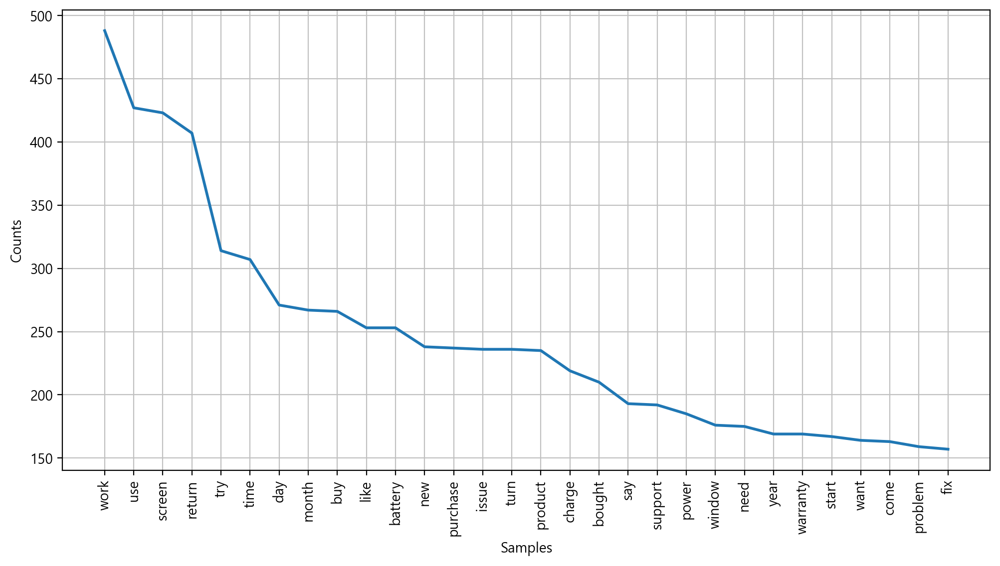

In [96]:
# 단여별 등장빈도 그래프
total_1.plot_frequent_tokens(tokens, 30)

* 화면
* 시간
* 배터리
* issue, support, warranty, problem, fix
* charge

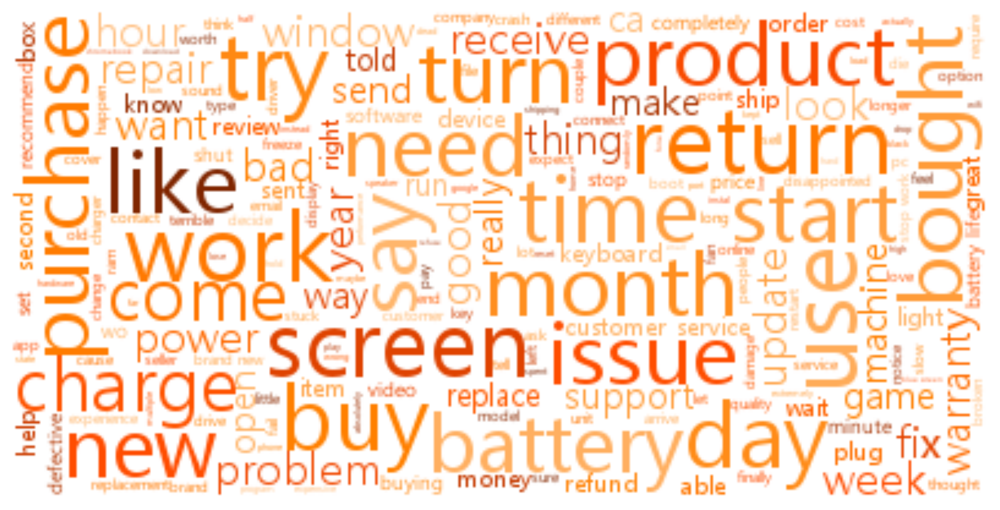

In [97]:
# 워드클라우드
def image_colors(word, font_size, position, orientation, random_state=None, **kwargs):
    return'hsl(25, 150%%, %d%%)' % random.randint(20, 80)

total_1.make_wordcloud(tokens, 80)

In [98]:
# LDA 모델링
corpus, coherence_score, n, model, topics = total_1.TopicLDA_makemodel(tokens, 7)

In [99]:
# 토픽
topics

[(0,
  '0.017*"turn" + 0.014*"use" + 0.014*"time" + 0.013*"month" + 0.010*"purchase" + 0.009*"new" + 0.008*"device"'),
 (1,
  '0.015*"product" + 0.013*"screen" + 0.013*"time" + 0.012*"work" + 0.011*"return" + 0.010*"try" + 0.009*"purchase"'),
 (2,
  '0.014*"work" + 0.013*"screen" + 0.012*"use" + 0.011*"return" + 0.010*"battery" + 0.009*"time" + 0.009*"like"'),
 (3,
  '0.020*"work" + 0.017*"screen" + 0.012*"return" + 0.010*"new" + 0.009*"day" + 0.009*"start" + 0.008*"month"'),
 (4,
  '0.022*"return" + 0.018*"try" + 0.014*"work" + 0.011*"day" + 0.010*"use" + 0.010*"screen" + 0.009*"box"'),
 (5,
  '0.014*"use" + 0.014*"buy" + 0.011*"battery" + 0.011*"issue" + 0.010*"work" + 0.010*"screen" + 0.008*"need"'),
 (6,
  '0.014*"use" + 0.012*"power" + 0.012*"product" + 0.012*"customer" + 0.010*"month" + 0.010*"want" + 0.009*"battery"'),
 (7,
  '0.012*"warranty" + 0.010*"battery" + 0.008*"work" + 0.007*"update" + 0.007*"use" + 0.007*"bought" + 0.006*"like"')]

**각 토픽이 의미하는 바가 불분명하다.**

0. 시간, 구매
1. 화면
2. 반품
3. 반품
4. 반품
5. 배터리
6. 파워
7. warranty

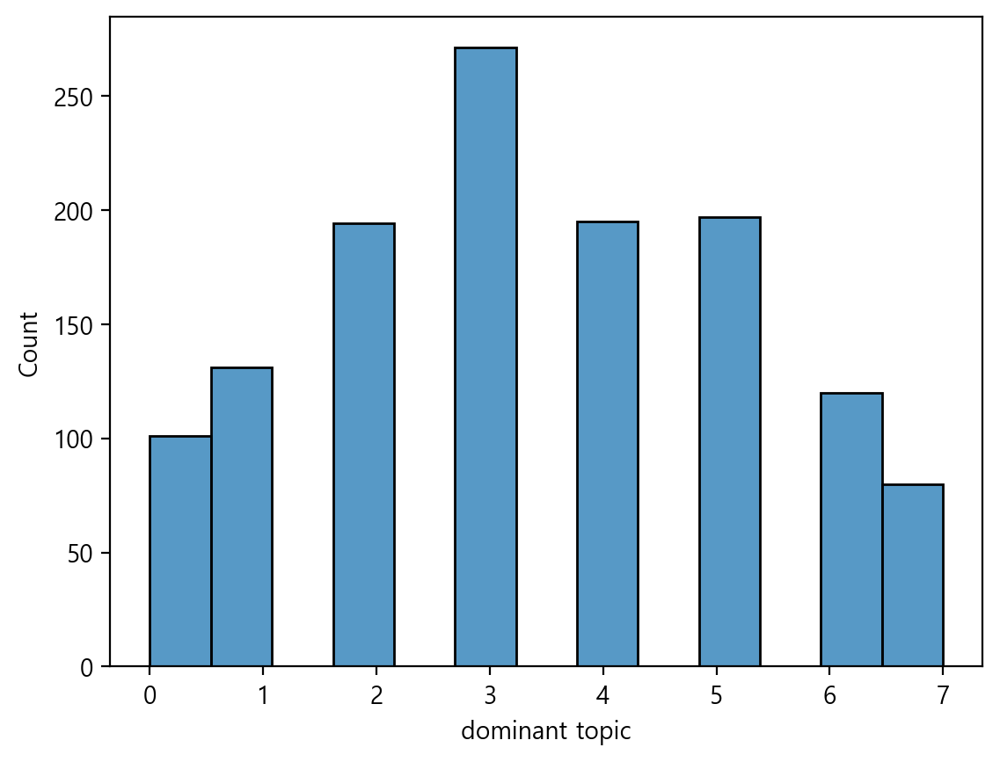

,customer_id,rating,title,country,date,content,helpful,product_name,company,year,month,day,dayofweek,dominant topic,portion of dominant topic
0,techygardengirl,1.0,Beyond Stunned --- UPDATED RATING,미국,2022-12-17,JAN 2023 - The computer is stellar except for ...,53.0,Aspire 5 Intel Core i3-1115G4,Acer,2022,12,17,5,4,0.994656
1,Candide,1.0,"Wanted to love it, but disappointed",미국,2023-04-27,After having used this laptop for five months ...,12.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,04,27,3,1,0.611771
2,brandon,1.0,avoid at all costs. ships w. defective bios!,미국,2022-09-14,i bought this laptop thinking it would be perf...,28.0,Aspire 5 Intel Core i3-1115G4,Acer,2022,09,14,2,5,0.730745
3,Denese Dominguez,1.0,"Without compare, this is literally the worst l...",미국,2023-03-11,The cursor constantly disappears from the scre...,8.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,03,11,5,2,0.988320
4,Amazon Customer,1.0,Lots of problems with this computer,미국,2023-03-24,In the first 3 1/2 months this computer has lo...,7.0,Aspire 5 Intel Core i3-1115G4,Acer,2023,03,24,4,2,0.989048


In [100]:
# 토픽별 문서 분포
df_dist = total_1.TopicLDA_distribution(model, corpus)
df_dist.head()

* 3번 토픽이 가장 빈번하게 나타난다.

In [101]:
# 토픽 일관성
avg_topic_coherence = total_1.TopicLDA_coherence(model, corpus, n)

Average topic coherence: -1.8054.
[([(0.01973896, 'work'),
   (0.017359516, 'screen'),
   (0.011965402, 'return'),
   (0.0097391885, 'new'),
   (0.009276549, 'day'),
   (0.008641939, 'start'),
   (0.00827168, 'month'),
   (0.008258501, 'turn'),
   (0.008116288, 'time'),
   (0.007406514, 'use'),
   (0.0072649973, 'try'),
   (0.007252886, 'purchase'),
   (0.0072430484, 'issue'),
   (0.00704426, 'year'),
   (0.0069636814, 'fix'),
   (0.006713382, 'say'),
   (0.006677391, 'like'),
   (0.0065473793, 'product'),
   (0.0065386314, 'buy'),
   (0.00639498, 'receive')],
  -1.6455069494231205),
 ([(0.013964491, 'use'),
   (0.013674967, 'buy'),
   (0.011126897, 'battery'),
   (0.011076476, 'issue'),
   (0.00993109, 'work'),
   (0.009924639, 'screen'),
   (0.008278879, 'need'),
   (0.008108733, 'charge'),
   (0.007568689, 'time'),
   (0.0071097305, 'power'),
   (0.007071396, 'support'),
   (0.006788843, 'fix'),
   (0.0064826338, 'like'),
   (0.0062534297, 'new'),
   (0.006100052, 'month'),
   (0.00

## Razer 데이터 

### 데이터 불러오기

In [111]:
# 전체 회사의 데이터를 하나의 데이터프레임에 저장
df_razer = df[df['company'] == 'Razer']
df_razer.reset_index(inplace=True, drop=True)
df_razer.head()

,customer_id,rating,title,country,date,content,helpful,product_name,company,year,month,day,dayofweek
0,R.A.O,5.0,"A Small, But Very Powerful Device",미국,2021-11-27,Review is based of having the computer as a da...,18.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,11,27,5
1,Tanmay,5.0,Excellent portable gaming laptop,미국,2021-07-07,I'm writing this review for anyone who's on th...,65.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,07,07,2
2,Michael,5.0,2 years later: clean the dust,미국,2021-07-23,"The orginal paste job was bad, I recommend put...",21.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,07,23,4
3,Brandon Relaz,5.0,The Golden Standard,미국,2021-07-20,I was weighing my options between getting a fu...,5.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,07,20,1
4,PAOLO,5.0,Perfect! I Love it!,미국,2021-11-28,I ordered this laptop to be shipped overseas....,4.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,11,28,6


In [112]:
df_razer.shape

(381, 13)

In [113]:
# information
df_razer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381 entries, 0 to 380
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   customer_id   381 non-null    object 
 1   rating        381 non-null    float64
 2   title         381 non-null    object 
 3   country       381 non-null    object 
 4   date          381 non-null    object 
 5   content       381 non-null    object 
 6   helpful       381 non-null    float64
 7   product_name  381 non-null    object 
 8   company       381 non-null    object 
 9   year          381 non-null    object 
 10  month         381 non-null    object 
 11  day           381 non-null    object 
 12  dayofweek     381 non-null    int64  
dtypes: float64(2), int64(1), object(10)
memory usage: 38.8+ KB


In [114]:
# 기초통계량
df_razer.describe()

,rating,helpful,dayofweek
count,381.000000,381.000000,381.000000
mean,3.406824,5.199475,2.708661
std,1.718278,14.008347,1.904746
min,1.000000,0.000000,0.000000
25%,1.000000,0.000000,1.000000
50%,4.000000,1.000000,3.000000
75%,5.000000,4.000000,4.000000
max,5.000000,109.000000,6.000000


* 별점 평균은 약 3.4로 전체보다 0.1정도 낮다.
* 도움이 되는 리뷰라고 판단한 수는 평균 5.1, 최대 109

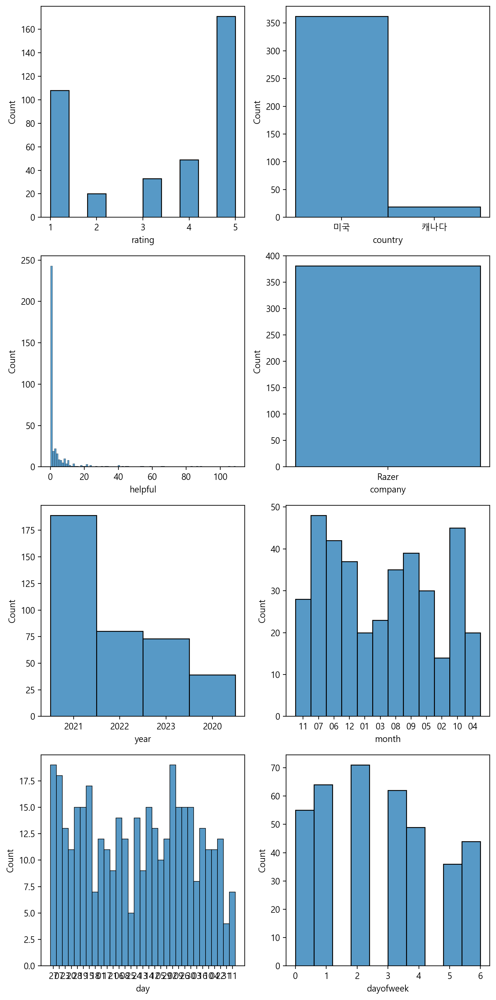

In [115]:
col_list = df_razer.columns
col_list = col_list.drop(['customer_id', 'title', 'date', 'content', 'product_name'])

fig, axes = plt.subplots(4, 2, figsize=(8, 16))

for i, cname in enumerate(col_list):
    row = i // 2
    col = i % 2
    sns.histplot(x=cname, data=df_razer, ax=axes[row][col])
    
fig.tight_layout()

* rating: 5점 > 1점 > 4점 > 3점 > 1점
* country: 미국이 압도적으로 많다.
* helpful: 0 값이 가장 많다.
* year: 2021년의 리뷰가 가장 많고, 가장 적은 것은 2020년이다.
* month: 7월에 가장 많은 리뷰가 작성되었고, 2월의 리뷰가 가장 적다.
* day
* dayofweek: 화요일의 리뷰가 가장 많고, 토요일의 리뷰가 가장 적다.

### 전체 리뷰

In [116]:
nltk_stopwords = set(stopwords.words('english')) 
sklearn_stopwords = set(_stop_words.ENGLISH_STOP_WORDS)
custom_stopwords = set(['laptop', 'computer', 'razer', 'blade', 'amazon',
                        'la', 'el', 'en', 'e', 'para'])

my_stopwords = nltk_stopwords.union(sklearn_stopwords)
my_stopwords = my_stopwords.union(custom_stopwords)

In [117]:
razer = NLP_Processor(df_razer)

In [118]:
# 토큰화
tokens = razer.make_tokens_list()
tokens[:10]

0    [review, base, daily, driver, meant, game, med...
1    [write, review, fence, purchasing, really, con...
2    [orginal, paste, job, bad, recommend, frustrat...
3    [weigh, option, desktop, pc, work, tech, field...
4    [order, ship, arrive, day, earlier, prime, com...
5    [heat, cpu, gpu, normal, temp, exterior, keybo...
6    [pricey, coin, phenomenal, screen, perfect, si...
7    [impressive, form, really, good, balance, size...
8    [overall, experience, build, quality, rgb, key...
9    [love, ability, max, game, want, play, option,...
dtype: object

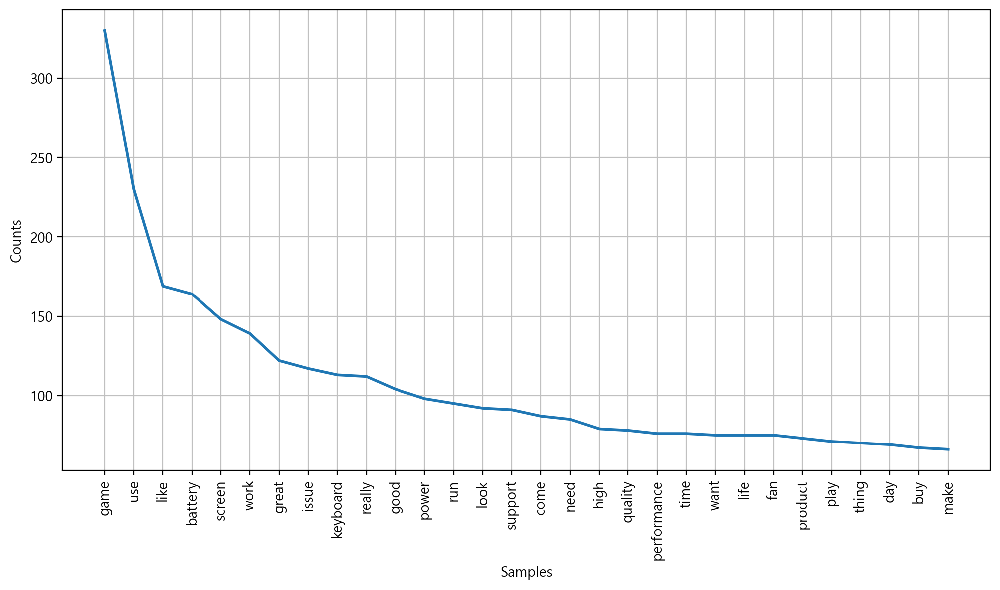

In [119]:
# 단여별 등장빈도 그래프
razer.plot_frequent_tokens(tokens, 30)

* 게임
* 배터리
* 화면
* issue, support
* 키보드
* 품질
* 퍼포먼스

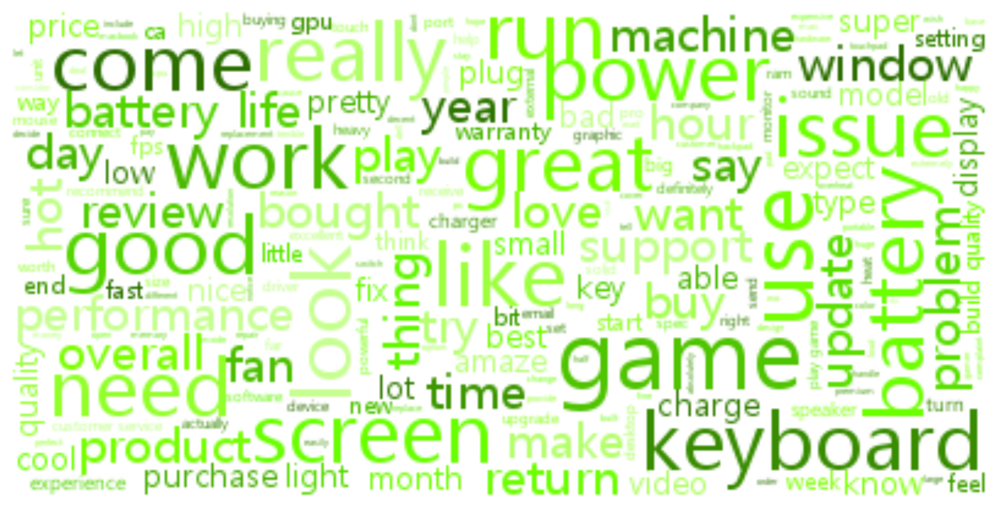

In [120]:
# 워드클라우드
def image_colors(word, font_size, position, orientation, random_state=None, **kwargs):
    return'hsl(93, 120%%, %d%%)' % random.randint(20, 80)

razer.make_wordcloud(tokens, 80)

In [121]:
# LDA 모델링
corpus, coherence_score, n, model, topics = razer.TopicLDA_makemodel(tokens, 7)

In [122]:
# 토픽
topics

[(0,
  '0.017*"game" + 0.011*"use" + 0.010*"screen" + 0.009*"battery" + 0.009*"power" + 0.008*"keyboard" + 0.007*"like"'),
 (1,
  '0.014*"game" + 0.011*"battery" + 0.011*"use" + 0.010*"like" + 0.009*"issue" + 0.007*"good" + 0.007*"work"'),
 (2,
  '0.020*"game" + 0.014*"use" + 0.010*"work" + 0.009*"like" + 0.008*"screen" + 0.007*"great" + 0.007*"really"')]

**토픽에 따른 특징이 뚜렷하지 않음**

0. 게임, 화면, 배터리, 파워, 키보드
1. 게임, 배터리, issue
2. 게임

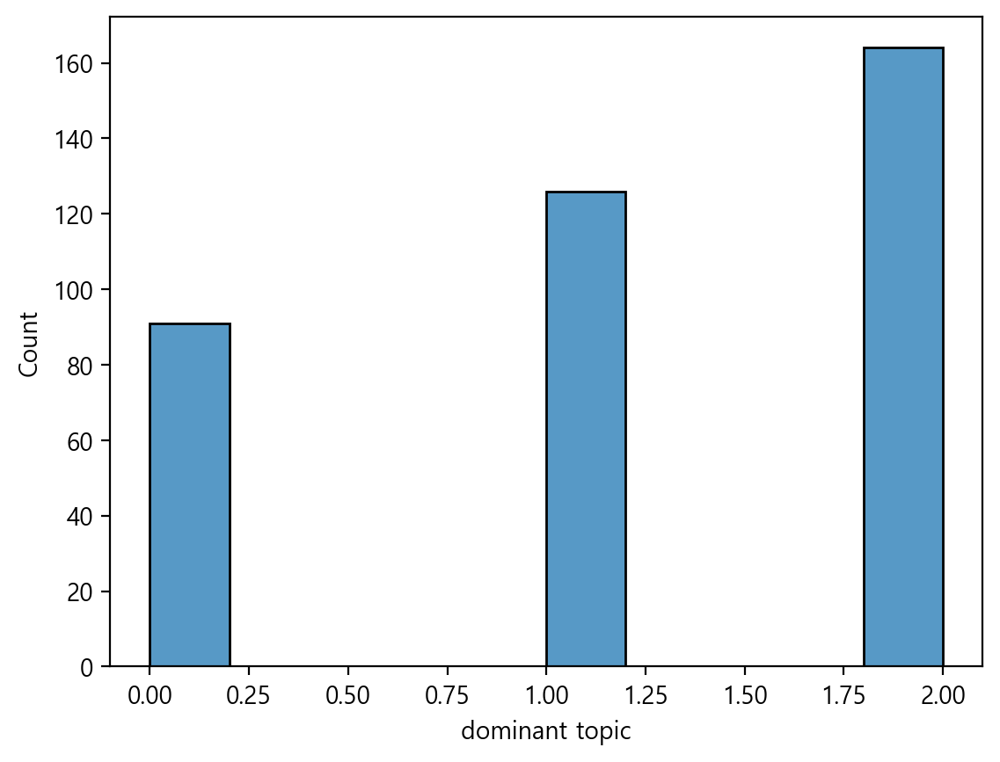

,customer_id,rating,title,country,date,content,helpful,product_name,company,year,month,day,dayofweek,dominant topic,portion of dominant topic
0,R.A.O,5.0,"A Small, But Very Powerful Device",미국,2021-11-27,Review is based of having the computer as a da...,18.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,11,27,5,2,0.996367
1,Tanmay,5.0,Excellent portable gaming laptop,미국,2021-07-07,I'm writing this review for anyone who's on th...,65.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,07,07,2,2,0.996050
2,Michael,5.0,2 years later: clean the dust,미국,2021-07-23,"The orginal paste job was bad, I recommend put...",21.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,07,23,4,2,0.994767
3,Brandon Relaz,5.0,The Golden Standard,미국,2021-07-20,I was weighing my options between getting a fu...,5.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,07,20,1,2,0.992779
4,PAOLO,5.0,Perfect! I Love it!,미국,2021-11-28,I ordered this laptop to be shipped overseas....,4.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,11,28,6,0,0.992577


In [123]:
# 토픽별 문서 분포
df_dist = razer.TopicLDA_distribution(model, corpus)
df_dist.head()

* 2번 토픽이 가장 빈번하게 나타남

In [124]:
# 토픽 일관성
avg_topic_coherence = razer.TopicLDA_coherence(model, corpus, n)

Average topic coherence: -1.3620.
[([(0.017215135, 'game'),
   (0.011122583, 'use'),
   (0.009867704, 'screen'),
   (0.008627066, 'battery'),
   (0.008611848, 'power'),
   (0.0075945607, 'keyboard'),
   (0.007217254, 'like'),
   (0.0066731838, 'fan'),
   (0.005403525, 'look'),
   (0.0052711745, 'issue'),
   (0.005262891, 'good'),
   (0.005254314, 'great'),
   (0.00513294, 'come'),
   (0.0050627952, 'key'),
   (0.004738548, 'life'),
   (0.0046079294, 'really'),
   (0.004570488, 'review'),
   (0.004462218, 'return'),
   (0.0043964116, 'run'),
   (0.004037022, 'make')],
  -1.3382613206010814),
 ([(0.020337798, 'game'),
   (0.014160071, 'use'),
   (0.009879387, 'work'),
   (0.008811477, 'like'),
   (0.0077106934, 'screen'),
   (0.0070974724, 'great'),
   (0.006855806, 'really'),
   (0.0065904027, 'support'),
   (0.006505877, 'battery'),
   (0.0060676318, 'run'),
   (0.0056681377, 'need'),
   (0.0056458306, 'keyboard'),
   (0.0050774044, 'play'),
   (0.0048955497, 'product'),
   (0.00486417

### 5점 리뷰

In [125]:
df_razer_5 = df_razer[df_razer['rating'] == 5.0]
df_razer_5.reset_index(inplace=True, drop=True)
df_razer_5.head()

,customer_id,rating,title,country,date,content,helpful,product_name,company,year,month,day,dayofweek
0,R.A.O,5.0,"A Small, But Very Powerful Device",미국,2021-11-27,Review is based of having the computer as a da...,18.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,11,27,5
1,Tanmay,5.0,Excellent portable gaming laptop,미국,2021-07-07,I'm writing this review for anyone who's on th...,65.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,07,07,2
2,Michael,5.0,2 years later: clean the dust,미국,2021-07-23,"The orginal paste job was bad, I recommend put...",21.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,07,23,4
3,Brandon Relaz,5.0,The Golden Standard,미국,2021-07-20,I was weighing my options between getting a fu...,5.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,07,20,1
4,PAOLO,5.0,Perfect! I Love it!,미국,2021-11-28,I ordered this laptop to be shipped overseas....,4.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,11,28,6


In [126]:
razer_5 = NLP_Processor(df_razer_5)

In [127]:
# 토큰화
tokens = razer_5.make_tokens_list()
tokens[:10]

0    [review, base, daily, driver, meant, game, med...
1    [write, review, fence, purchasing, really, con...
2    [orginal, paste, job, bad, recommend, frustrat...
3    [weigh, option, desktop, pc, work, tech, field...
4    [order, ship, arrive, day, earlier, prime, com...
5    [heat, cpu, gpu, normal, temp, exterior, keybo...
6    [pricey, coin, phenomenal, screen, perfect, si...
7    [impressive, form, really, good, balance, size...
8    [overall, experience, build, quality, rgb, key...
9    [love, ability, max, game, want, play, option,...
dtype: object

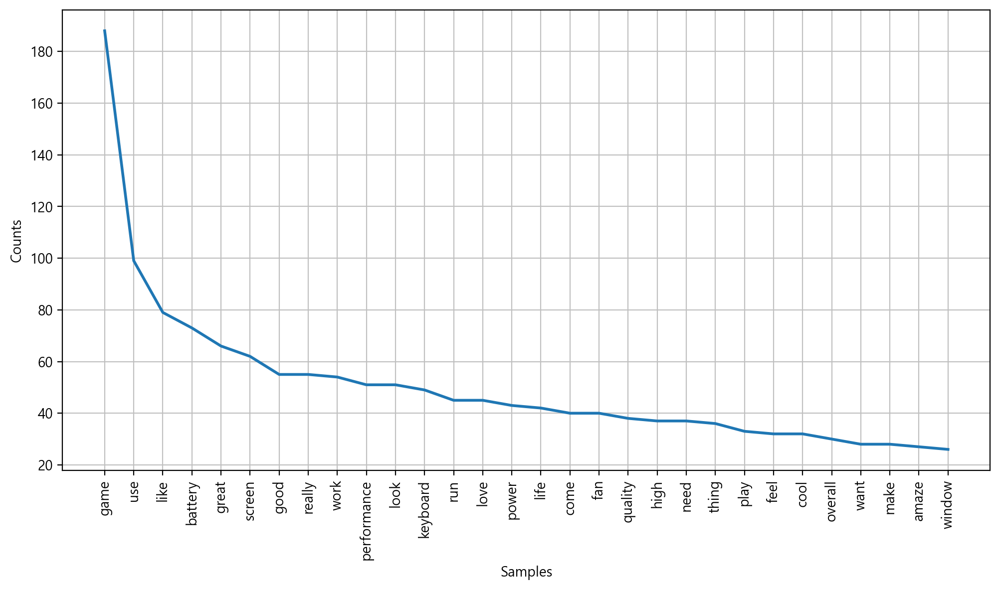

In [128]:
# 단여별 등장빈도 그래프
razer_5.plot_frequent_tokens(tokens, 30)

* 게임
* 배터리
* 화면
* performance
* keyboard
* power
* fan
* 품질
* 전체적으로

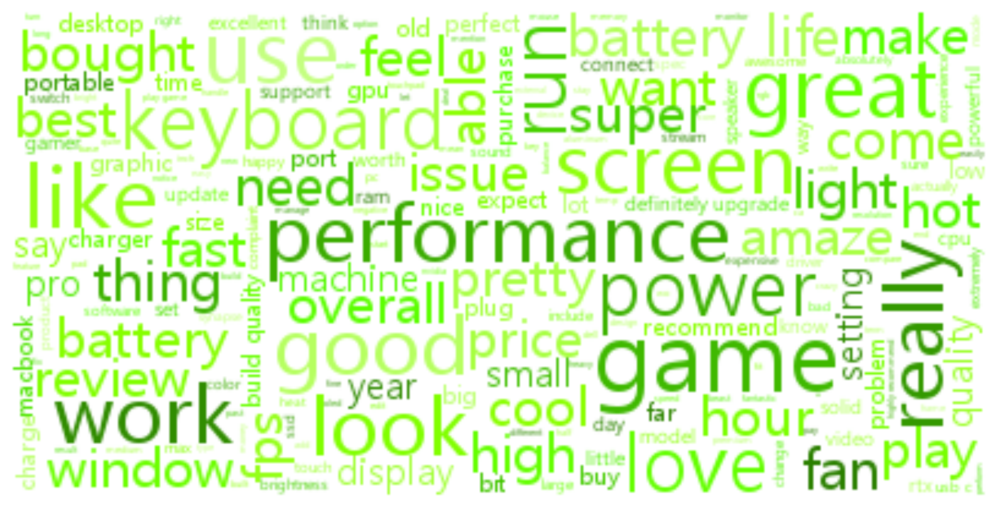

In [129]:
# 워드클라우드
def image_colors(word, font_size, position, orientation, random_state=None, **kwargs):
    return'hsl(93, 150%%, %d%%)' % random.randint(20, 80)

razer_5.make_wordcloud(tokens, 80)

In [130]:
# LDA 모델링
corpus, coherence_score, n, model, topics = razer_5.TopicLDA_makemodel(tokens, 7)

In [131]:
# 토픽
topics

[(0,
  '0.033*"game" + 0.019*"use" + 0.010*"really" + 0.009*"great" + 0.009*"like" + 0.008*"play" + 0.008*"battery"'),
 (1,
  '0.013*"like" + 0.013*"game" + 0.012*"keyboard" + 0.011*"good" + 0.010*"use" + 0.009*"battery" + 0.008*"need"'),
 (2,
  '0.024*"game" + 0.013*"great" + 0.010*"battery" + 0.009*"use" + 0.009*"work" + 0.008*"screen" + 0.007*"love"'),
 (3,
  '0.018*"game" + 0.013*"like" + 0.011*"battery" + 0.010*"performance" + 0.010*"screen" + 0.010*"look" + 0.008*"fan"')]

0. 게임
1. 키보드, 배터리
2. 배터리, 화면
3. 배터리, performance, 화면

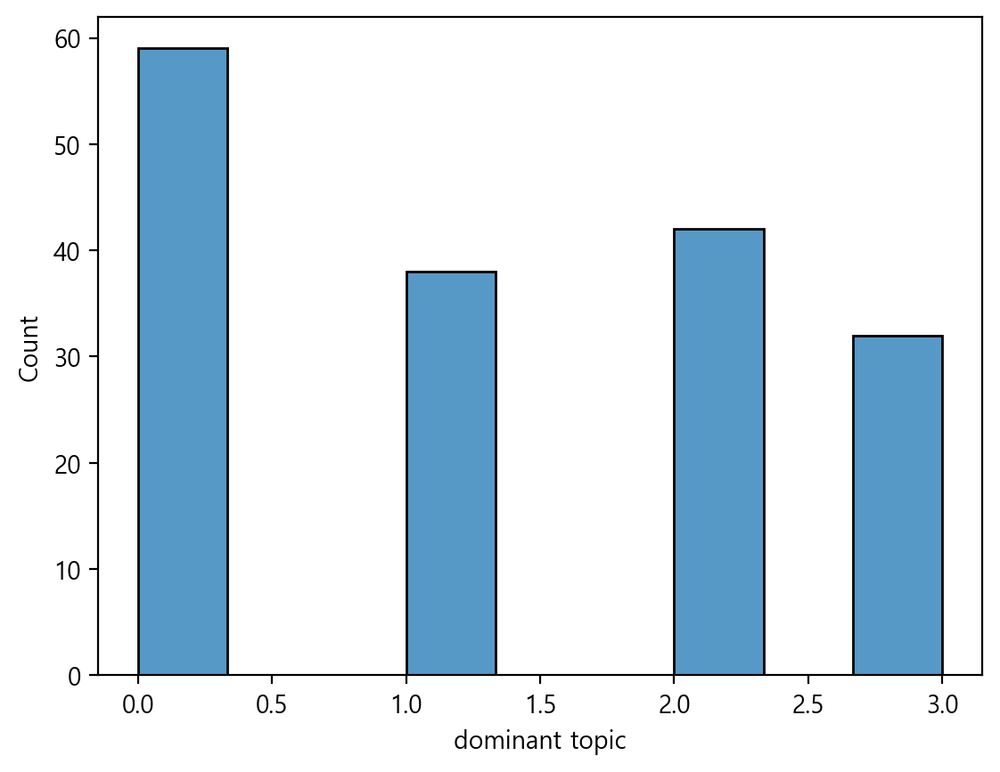

,customer_id,rating,title,country,date,content,helpful,product_name,company,year,month,day,dayofweek,dominant topic,portion of dominant topic
0,R.A.O,5.0,"A Small, But Very Powerful Device",미국,2021-11-27,Review is based of having the computer as a da...,18.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,11,27,5,0,0.996406
1,Tanmay,5.0,Excellent portable gaming laptop,미국,2021-07-07,I'm writing this review for anyone who's on th...,65.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,07,07,2,0,0.995961
2,Michael,5.0,2 years later: clean the dust,미국,2021-07-23,"The orginal paste job was bad, I recommend put...",21.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,07,23,4,2,0.994690
3,Brandon Relaz,5.0,The Golden Standard,미국,2021-07-20,I was weighing my options between getting a fu...,5.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,07,20,1,0,0.992585
4,PAOLO,5.0,Perfect! I Love it!,미국,2021-11-28,I ordered this laptop to be shipped overseas....,4.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,11,28,6,3,0.992379


In [132]:
# 토픽별 문서 분포
df_dist = razer_5.TopicLDA_distribution(model, corpus)
df_dist.head()

* 0번 토픽이 가장 빈번하게 나타난다.

In [133]:
# 토픽 일관성
avg_topic_coherence = razer_5.TopicLDA_coherence(model, corpus, n)

Average topic coherence: -1.3288.
[([(0.033400234, 'game'),
   (0.019467385, 'use'),
   (0.010057643, 'really'),
   (0.009403096, 'great'),
   (0.008659115, 'like'),
   (0.0083327135, 'play'),
   (0.008309656, 'battery'),
   (0.0075913877, 'screen'),
   (0.007086119, 'keyboard'),
   (0.006972549, 'performance'),
   (0.006883347, 'look'),
   (0.0063419193, 'run'),
   (0.0063174823, 'good'),
   (0.0062098405, 'power'),
   (0.0061770864, 'work'),
   (0.005538984, 'fps'),
   (0.0049750246, 'high'),
   (0.0049187033, 'able'),
   (0.004779853, 'come'),
   (0.004658727, 'love')],
  -1.2328904967973606),
 ([(0.013172164, 'like'),
   (0.013147893, 'game'),
   (0.011639363, 'keyboard'),
   (0.011225669, 'good'),
   (0.009997084, 'use'),
   (0.00858681, 'battery'),
   (0.00824619, 'need'),
   (0.007402611, 'ram'),
   (0.007014865, 'run'),
   (0.006806141, 'fan'),
   (0.006606475, 'work'),
   (0.0062772655, 'great'),
   (0.0062339623, 'make'),
   (0.006189232, 'want'),
   (0.0061139236, 'love'),
 

### 1점 리뷰

In [134]:
df_razer_1 = df_razer[df_razer['rating'] == 1.0]
df_razer_1.reset_index(inplace=True, drop=True)
df_razer_1.head()

,customer_id,rating,title,country,date,content,helpful,product_name,company,year,month,day,dayofweek
0,James Armstrong,1.0,Razer's Subpar Support,미국,2021-11-12,I was very excited to receive this laptop. It ...,3.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,11,12,4
1,Janar J. Wasito,1.0,terrible keyboard avoid! NOT FUNCTIONAL DUE TO...,미국,2022-12-30,I am now adding to my negative review due to t...,0.0,Blade 14 AM Ryzen 9 6900HX,Razer,2022,12,30,4
2,Blake,1.0,"Perfect Laptop, when it works (Sent back 3 tim...",미국,2022-06-12,"Have had this device for about 10 months now, ...",0.0,Blade 14 AM Ryzen 9 6900HX,Razer,2022,06,12,6
3,Dog lover,1.0,DO NOT BUY RAZER PRODUCTS!!,미국,2023-05-04,I bought this laptop and for a year it was sol...,4.0,Blade 14 AM Ryzen 9 6900HX,Razer,2023,05,04,3
4,Joseph,1.0,Not worth the money.,미국,2023-10-19,Only a few days of using the product and I alr...,0.0,Blade 14 AM Ryzen 9 6900HX,Razer,2023,10,19,3


In [135]:
razer_1 = NLP_Processor(df_razer_1)

In [136]:
# 토큰화
tokens = razer_1.make_tokens_list()
tokens[:10]

0    [excite, receive, work, great, game, crash, en...
1    [add, negative, review, horrible, mobile, prof...
2    [device, month, send, warranty, repair, graphi...
3    [bought, year, blue, suspiciously, month, warr...
4    [day, use, product, constant, crash, random, c...
5    [month, bought, razor, technical, support, lea...
6    [let, start, say, machine, good, recieved, uni...
7    [god, awful, sticker, palm, type, tear, leave,...
8    [start, screen, look, great, track, pad, start...
9    [screen, incredibly, dim, power, port, pin, br...
dtype: object

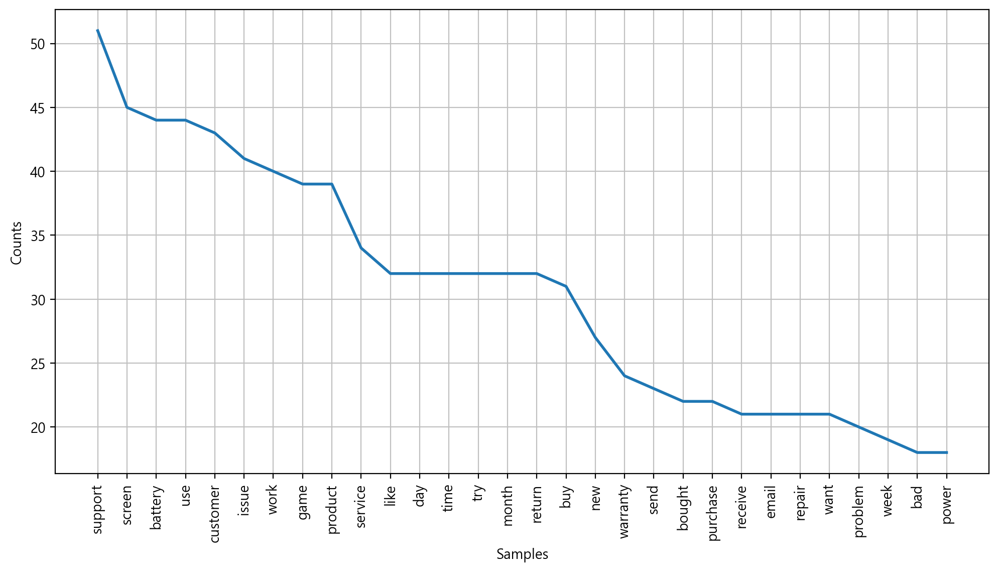

In [137]:
# 단여별 등장빈도 그래프
razer_1.plot_frequent_tokens(tokens, 30)

* support, customer, issue, service, warranty, repair, problem
* 화면
* 배터리
* day, time, month
* purchase, receive

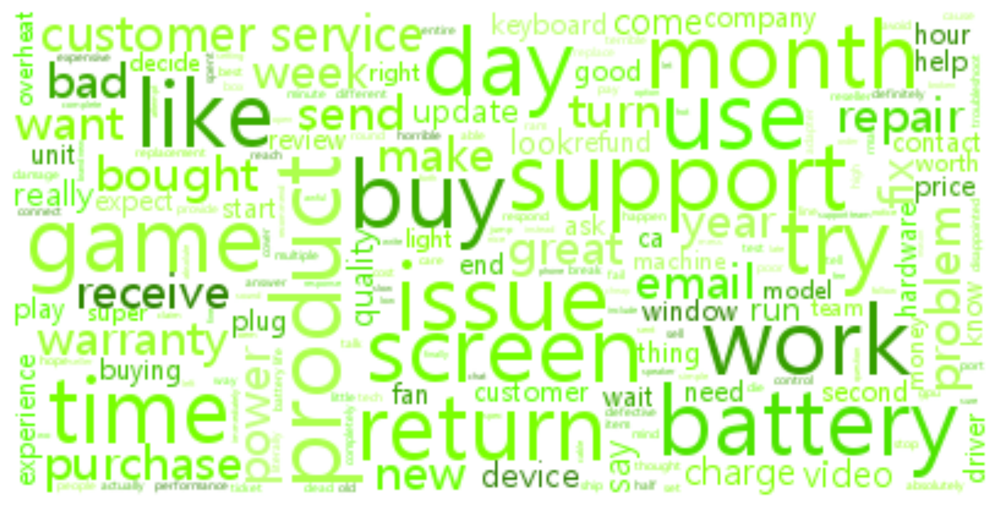

In [138]:
# 워드클라우드
def image_colors(word, font_size, position, orientation, random_state=None, **kwargs):
    return'hsl(93, 150%%, %d%%)' % random.randint(20, 80)

razer_1.make_wordcloud(tokens, 80)

In [139]:
# LDA 모델링
corpus, coherence_score, n, model, topics = razer_1.TopicLDA_makemodel(tokens, 7)

In [140]:
# 토픽
topics

[(0,
  '0.014*"battery" + 0.012*"month" + 0.012*"like" + 0.010*"customer" + 0.009*"issue" + 0.009*"service" + 0.009*"product"'),
 (1,
  '0.012*"buy" + 0.011*"issue" + 0.011*"battery" + 0.010*"screen" + 0.009*"try" + 0.009*"new" + 0.007*"driver"'),
 (2,
  '0.014*"support" + 0.012*"return" + 0.012*"work" + 0.012*"customer" + 0.012*"product" + 0.012*"day" + 0.011*"use"'),
 (3,
  '0.013*"screen" + 0.013*"use" + 0.009*"try" + 0.008*"end" + 0.008*"service" + 0.008*"customer" + 0.007*"fan"'),
 (4,
  '0.015*"screen" + 0.015*"game" + 0.015*"support" + 0.008*"work" + 0.007*"run" + 0.007*"time" + 0.006*"send"')]

0. 배터리, issue, customer service
1. 구매 시 문제?
2. support, return
3. customer service
4. support

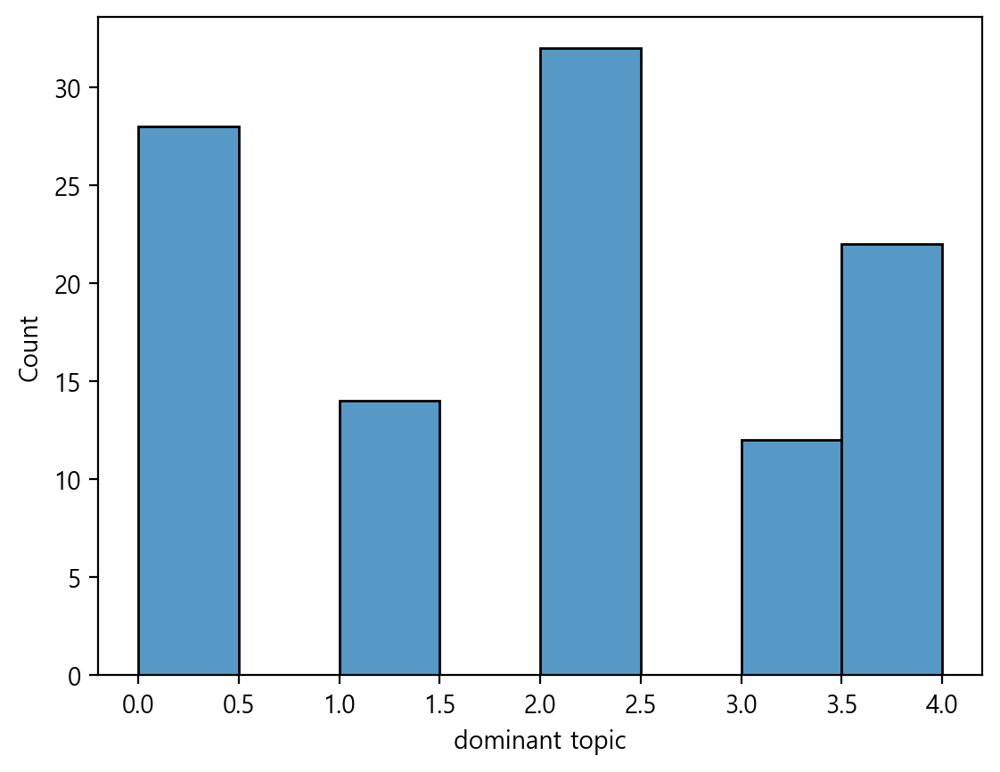

,customer_id,rating,title,country,date,content,helpful,product_name,company,year,month,day,dayofweek,dominant topic,portion of dominant topic
0,James Armstrong,1.0,Razer's Subpar Support,미국,2021-11-12,I was very excited to receive this laptop. It ...,3.0,Blade 14 AM Ryzen 9 6900HX,Razer,2021,11,12,4,2,0.993527
1,Janar J. Wasito,1.0,terrible keyboard avoid! NOT FUNCTIONAL DUE TO...,미국,2022-12-30,I am now adding to my negative review due to t...,0.0,Blade 14 AM Ryzen 9 6900HX,Razer,2022,12,30,4,0,0.991232
2,Blake,1.0,"Perfect Laptop, when it works (Sent back 3 tim...",미국,2022-06-12,"Have had this device for about 10 months now, ...",0.0,Blade 14 AM Ryzen 9 6900HX,Razer,2022,06,12,6,2,0.991555
3,Dog lover,1.0,DO NOT BUY RAZER PRODUCTS!!,미국,2023-05-04,I bought this laptop and for a year it was sol...,4.0,Blade 14 AM Ryzen 9 6900HX,Razer,2023,05,04,3,2,0.987151
4,Joseph,1.0,Not worth the money.,미국,2023-10-19,Only a few days of using the product and I alr...,0.0,Blade 14 AM Ryzen 9 6900HX,Razer,2023,10,19,3,2,0.942347


In [141]:
# 토픽별 문서 분포
df_dist = razer_1.TopicLDA_distribution(model, corpus)
df_dist.head()

* 2번 토픽이 가장 빈번하게 등장한다.

In [142]:
# 토픽 일관성
avg_topic_coherence = razer_1.TopicLDA_coherence(model, corpus, n)

Average topic coherence: -2.3180.
[([(0.015297605, 'screen'),
   (0.015242713, 'game'),
   (0.014969862, 'support'),
   (0.008275598, 'work'),
   (0.0072909016, 'run'),
   (0.007251297, 'time'),
   (0.0062504266, 'send'),
   (0.006248698, 'day'),
   (0.006237099, 'year'),
   (0.006230492, 'want'),
   (0.0062181763, 'really'),
   (0.0062139845, 'buy'),
   (0.0061149765, 'like'),
   (0.0052356324, 'try'),
   (0.00523338, 'week'),
   (0.0052299583, 'issue'),
   (0.005223296, 'new'),
   (0.005221887, 'battery'),
   (0.0052165077, 'turn'),
   (0.004246698, 'product')],
  -1.5086590930799466),
 ([(0.013681385, 'support'),
   (0.012239299, 'return'),
   (0.011989845, 'work'),
   (0.011931077, 'customer'),
   (0.011709936, 'product'),
   (0.011558044, 'day'),
   (0.010680453, 'use'),
   (0.010136071, 'service'),
   (0.0082996655, 'receive'),
   (0.008241437, 'email'),
   (0.007864681, 'battery'),
   (0.007839787, 'issue'),
   (0.007401739, 'power'),
   (0.0073667895, 'time'),
   (0.007113329, 